# Automatic Image Captioning

## Step 1: Initializing the COCO API

We begin by initializing the [COCO API](https://github.com/cocodataset/cocoapi) that we will use to obtain the data.

In [1]:
!git clone https://github.com/cocodataset/cocoapi.git

Cloning into 'cocoapi'...
remote: Enumerating objects: 975, done.
remote: Total 975 (delta 0), reused 0 (delta 0), pack-reused 975 (from 1)
Receiving objects: 100% (975/975), 11.72 MiB | 17.32 MiB/s, done.
Resolving deltas: 100% (576/576), done.


In [2]:
!wget http://images.cocodataset.org/annotations/annotations_trainval2014.zip
!unzip annotations_trainval2014.zip -d /content/cocoapi

--2025-02-13 04:56:54--  http://images.cocodataset.org/annotations/annotations_trainval2014.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.28.223, 52.216.212.241, 52.217.130.225, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.28.223|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252872794 (241M) [application/zip]
Saving to: ‘annotations_trainval2014.zip’

annotations_trainva 100%[===================>] 241.16M  87.5MB/s    in 2.8s    

2025-02-13 04:56:57 (87.5 MB/s) - ‘annotations_trainval2014.zip’ saved [252872794/252872794]

Archive:  annotations_trainval2014.zip
  inflating: /content/cocoapi/annotations/instances_train2014.json  
  inflating: /content/cocoapi/annotations/instances_val2014.json  
  inflating: /content/cocoapi/annotations/person_keypoints_train2014.json  
  inflating: /content/cocoapi/annotations/person_keypoints_val2014.json  
  inflating: /content/cocoapi/annotations/captions_train2014.json  
  i

In [3]:
import os
import sys

from pycocotools.coco import COCO

# initialize COCO API for instance annotations
# path to cocoapi directory
data_dir = '/content/cocoapi'
data_type = "val2014"
instances_ann_file = os.path.join(
    data_dir, "annotations", f"instances_{data_type}.json"
)
coco = COCO(instances_ann_file)

# initialize COCO API for caption annotations
captions_ann_file = os.path.join(data_dir, "annotations", f"captions_{data_type}.json")
coco_caps = COCO(captions_ann_file)

# get image ids
ids = list(coco.anns.keys())

loading annotations into memory...
Done (t=6.76s)
creating index...
index created!
loading annotations into memory...
Done (t=0.41s)
creating index...
index created!


In [4]:
coco.anns

{156: {'segmentation': [[239.97,
    260.24,
    222.04,
    270.49,
    199.84,
    253.41,
    213.5,
    227.79,
    259.62,
    200.46,
    274.13,
    202.17,
    277.55,
    210.71,
    249.37,
    253.41,
    237.41,
    264.51,
    242.54,
    261.95,
    228.87,
    271.34]],
  'area': 2765.1486500000005,
  'iscrowd': 0,
  'image_id': 558840,
  'bbox': [199.84, 200.46, 77.71, 70.88],
  'category_id': 58,
  'id': 156},
 509: {'segmentation': [[247.71,
    354.7,
    253.49,
    346.99,
    276.63,
    337.35,
    312.29,
    333.49,
    364.34,
    331.57,
    354.7,
    327.71,
    369.16,
    325.78,
    376.87,
    333.49,
    383.61,
    330.6,
    379.76,
    321.93,
    365.3,
    320.0,
    356.63,
    317.11,
    266.02,
    331.57,
    260.24,
    334.46,
    260.24,
    337.35,
    242.89,
    338.31,
    234.22,
    338.31,
    234.22,
    348.92,
    239.04,
    353.73,
    248.67,
    355.66,
    252.53,
    353.73]],
  'area': 1545.4213000000007,
  'iscrowd': 0,
 

## Plotting a Sample Image and Caption

Plotting a random image from the dataset, along with its five corresponding captions.  Each time the code cell below is run, a different image is selected.  

{'license': 2, 'file_name': 'COCO_val2014_000000240295.jpg', 'coco_url': 'http://images.cocodataset.org/val2014/COCO_val2014_000000240295.jpg', 'height': 640, 'width': 512, 'date_captured': '2013-11-19 20:15:36', 'flickr_url': 'http://farm4.staticflickr.com/3625/3583134043_59e77f10f3_z.jpg', 'id': 240295}
http://images.cocodataset.org/val2014/COCO_val2014_000000240295.jpg


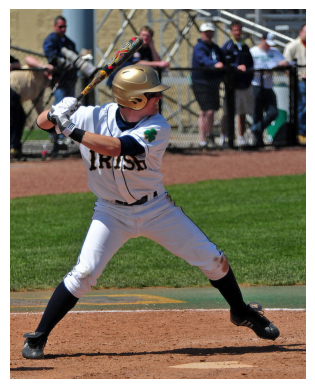

A man playing a baseball game on the field playing a game 
a man is holding a bat at a baseball game
A baseball player is swinging his bat on home base. 
A baseball player getting ready to swing at a pitch.
A baseball player is holding a baseball bat, preparing to swing.


In [5]:
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt

%matplotlib inline

# pick a random image and obtain the corresponding URL
ann_id = np.random.choice(ids)
img_id = coco.anns[ann_id]["image_id"]
img = coco.loadImgs(img_id)[0]
url = img["coco_url"]

print(img)
# print URL and visualize corresponding image
print(url)
I = io.imread(url)
plt.axis("off")
plt.imshow(I)
plt.show()

# load and display captions
ann_ids = coco_caps.getAnnIds(imgIds=img["id"])
anns = coco_caps.loadAnns(ann_ids)
coco_caps.showAnns(anns)

## Preprocessing Captions and Images

In [36]:
# Fetching our python files from google drive
%cd /content
!gdown --id 1eRFXPY3UASgQTFI90qb54vyababvI2dN
!unzip image_captioning.zip

/content
/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1eRFXPY3UASgQTFI90qb54vyababvI2dN
From (redirected): https://drive.google.com/uc?id=1eRFXPY3UASgQTFI90qb54vyababvI2dN&confirm=t&uuid=76aac280-a4a5-4744-ba6e-61fccdc90514
To: /content/image_captioning.zip
100% 378M/378M [00:08<00:00, 47.0MB/s]
Archive:  image_captioning.zip
   creating: automatic_image_captioning/
   creating: automatic_image_captioning/.gradio/
  inflating: automatic_image_captioning/.gradio/certificate.pem  
   creating: automatic_image_captioning/cocoapi/
  inflating: automatic_image_captioning/cocoapi/.gitignore  
  inflating: automatic_image_captioning/cocoapi/.travis.yml  
   creating: automatic_image_captioning/cocoapi/annotations/
  inflating: automatic_image_captioning/coco

In [37]:
%cd /content/automatic_image_captioning
from pycocotools.coco import COCO
import nltk
nltk.download('punkt_tab')
from data_loader import get_loader
import torch
import numpy as np
import torch.utils.data as data
from torchvision import transforms

nltk.download("punkt")
%load_ext autoreload
%autoreload 2

/content/automatic_image_captioning
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


### Define a transform to pre-process the training images

In [16]:
transform_train = transforms.Compose(
    [
        transforms.Resize(256),  # smaller edge of image resized to 256
        transforms.RandomCrop(224),  # get 224x224 crop from random location
        transforms.RandomHorizontalFlip(),  # horizontally flip image with probability=0.5
        transforms.ToTensor(),  # convert the PIL Image to a tensor
        transforms.Normalize(
            (0.485, 0.456, 0.406),  # normalize image for pre-trained model
            (0.229, 0.224, 0.225),
        ),
    ]
)

# Set the minimum word count threshold.
vocab_threshold = 5

# Specify the batch size.
batch_size = 10

# Path to cocoapi dir
cocoapi_dir = '/content'

# Obtain the data loader.
data_loader = get_loader(
    transform=transform_train,
    mode="train",
    batch_size=batch_size,
    vocab_threshold=vocab_threshold,
    vocab_from_file=False,
    cocoapi_loc=cocoapi_dir,
)

loading annotations into memory...
Done (t=0.95s)
creating index...
index created!
[0/414113] Tokenizing captions...
[100000/414113] Tokenizing captions...
[200000/414113] Tokenizing captions...
[300000/414113] Tokenizing captions...
[400000/414113] Tokenizing captions...
loading annotations into memory...
Done (t=0.85s)
creating index...
index created!
Obtaining caption lengths...


100%|██████████| 414113/414113 [00:46<00:00, 8985.56it/s]


In [17]:
sample_caption = "A person doing a trick on a rail while riding a skateboard."
sample_tokens = nltk.tokenize.word_tokenize(str(sample_caption).lower())
print(sample_tokens)

['a', 'person', 'doing', 'a', 'trick', 'on', 'a', 'rail', 'while', 'riding', 'a', 'skateboard', '.']


In [18]:
sample_caption = []

start_word = data_loader.dataset.vocab.start_word
print("Special start word:", start_word)
sample_caption.append(data_loader.dataset.vocab(start_word))
print(sample_caption)
sample_caption.extend([data_loader.dataset.vocab(token) for token in sample_tokens])
print(sample_caption)

Special start word: <start>
[0]
[0, 3, 98, 754, 3, 396, 39, 3, 1010, 207, 139, 3, 753, 18]


In [19]:
end_word = data_loader.dataset.vocab.end_word
print("Special end word:", end_word)

sample_caption.append(data_loader.dataset.vocab(end_word))
print(sample_caption)
sample_caption = torch.Tensor(sample_caption).long()
print(sample_caption)

Special end word: <end>
[0, 3, 98, 754, 3, 396, 39, 3, 1010, 207, 139, 3, 753, 18, 1]
tensor([   0,    3,   98,  754,    3,  396,   39,    3, 1010,  207,  139,    3,
         753,   18,    1])


In [20]:
# Preview the word2idx dictionary.
dict(list(data_loader.dataset.vocab.word2idx.items())[:10])
# Print the total number of keys in the word2idx dictionary.
print("Total number of tokens in vocabulary:", len(data_loader.dataset.vocab))

Total number of tokens in vocabulary: 8852


In [21]:
# Modify the minimum word count threshold.
vocab_threshold = 4

# Obtain the data loader.
data_loader = get_loader(
    transform=transform_train,
    mode="train",
    batch_size=batch_size,
    vocab_threshold=vocab_threshold,
    vocab_from_file=False,
    cocoapi_loc=cocoapi_dir,
)

# Print the total number of keys in the word2idx dictionary.
print(f"Total number of tokens in vocabulary: {len(data_loader.dataset.vocab)}")

loading annotations into memory...
Done (t=1.27s)
creating index...
index created!
[0/414113] Tokenizing captions...
[100000/414113] Tokenizing captions...
[200000/414113] Tokenizing captions...
[300000/414113] Tokenizing captions...
[400000/414113] Tokenizing captions...
loading annotations into memory...
Done (t=0.80s)
creating index...
index created!
Obtaining caption lengths...


100%|██████████| 414113/414113 [00:40<00:00, 10279.80it/s]


Total number of tokens in vocabulary: 9947


In [22]:
unk_word = data_loader.dataset.vocab.unk_word
print(f"Special unknown word: {unk_word}")

print(
    f"All unknown words are mapped to this integer: {data_loader.dataset.vocab(unk_word)}"
)

Special unknown word: <unk>
All unknown words are mapped to this integer: 2


In [23]:
print(data_loader.dataset.vocab("jfkafejw"))
print(data_loader.dataset.vocab("ieowoqjf"))
print(data_loader.dataset.vocab("."))

2
2
18


In [24]:
# Obtain the data loader (from file). Note that it runs much faster than before!
data_loader = get_loader(
    transform=transform_train,
    mode="train",
    batch_size=batch_size,
    vocab_from_file=True,
    cocoapi_loc=cocoapi_dir,
)

Vocabulary successfully loaded from vocab.pkl file!
loading annotations into memory...
Done (t=0.78s)
creating index...
index created!
Obtaining caption lengths...


100%|██████████| 414113/414113 [00:39<00:00, 10543.66it/s]


In [25]:
type(data_loader.dataset.caption_lengths), len(data_loader.dataset.caption_lengths)

(list, 414113)

In [26]:
from collections import Counter

# Tally the total number of training captions with each length.
counter = Counter(data_loader.dataset.caption_lengths)
lengths = sorted(counter.items(), key=lambda pair: pair[1], reverse=True)
for value, count in lengths:
    print("value: %2d --- count: %5d" % (value, count))

value: 10 --- count: 86302
value: 11 --- count: 79971
value:  9 --- count: 71920
value: 12 --- count: 57653
value: 13 --- count: 37668
value: 14 --- count: 22342
value:  8 --- count: 20742
value: 15 --- count: 12839
value: 16 --- count:  7736
value: 17 --- count:  4845
value: 18 --- count:  3101
value: 19 --- count:  2017
value:  7 --- count:  1594
value: 20 --- count:  1453
value: 21 --- count:   997
value: 22 --- count:   683
value: 23 --- count:   534
value: 24 --- count:   384
value: 25 --- count:   277
value: 26 --- count:   214
value: 27 --- count:   160
value: 28 --- count:   114
value: 29 --- count:    87
value: 30 --- count:    58
value: 31 --- count:    49
value: 32 --- count:    44
value: 34 --- count:    40
value: 37 --- count:    32
value: 35 --- count:    31
value: 33 --- count:    30
value: 36 --- count:    26
value: 38 --- count:    18
value: 39 --- count:    18
value: 43 --- count:    16
value: 44 --- count:    16
value: 48 --- count:    12
value: 45 --- count:    11
v

## Fetching COCO Dataset Images

In [27]:
import os

!cd /content
os.makedirs("/content/cocoapi/images")
!wget http://images.cocodataset.org/zips/train2014.zip
!wget http://images.cocodataset.org/zips/val2014.zip
!wget http://images.cocodataset.org/zips/test2014.zip

!unzip train2014.zip -d /content/cocoapi/images
!unzip val2014.zip -d /content/cocoapi/images
!unzip test2014.zip -d /content/cocoapi/images

Streaming output truncated to the last 5000 lines.
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000112376.jpg  
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000484597.jpg  
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000135715.jpg  
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000456549.jpg  
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000188376.jpg  
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000169328.jpg  
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000015971.jpg  
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000294000.jpg  
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000481459.jpg  
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000230069.jpg  
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000394792.jpg  
 extracting: /content/cocoapi/images/test2014/COCO_test2014_000000246684.jpg  
 

In [28]:
print(batch_size)
# Randomly sample a caption length, and sample indices with that length.
indices = data_loader.dataset.get_train_indices()
print("sampled indices:", indices)

# Create and assign a batch sampler to retrieve a batch with the sampled indices.
new_sampler = data.sampler.SubsetRandomSampler(indices=indices)
data_loader.batch_sampler.sampler = new_sampler

# Obtain the batch.
images, captions = next(iter(data_loader))

print("images.shape:", images.shape)
print("captions.shape:", captions.shape)

# Uncomment the lines of code below to print the pre-processed images and captions.
print('images:', images)
print('captions:', captions)

10
sampled indices: [187967, 24582, 101378, 401191, 310044, 138680, 52271, 8864, 314250, 33458]
images.shape: torch.Size([10, 3, 224, 224])
captions.shape: torch.Size([10, 22])
images: tensor([[[[ 0.3994,  0.4508,  0.4851,  ..., -1.7240, -1.6727, -1.5699],
          [ 0.3994,  0.4508,  0.4851,  ..., -1.8610, -1.8439, -1.8097],
          [ 0.4166,  0.4508,  0.4508,  ..., -1.9638, -1.9295, -1.9124],
          ...,
          [-0.9192, -0.9192, -0.9020,  ..., -1.7754, -1.7754, -1.7583],
          [-0.9192, -0.9363, -0.9192,  ..., -1.7412, -1.7240, -1.7069],
          [-0.9363, -0.9534, -0.9363,  ..., -1.7240, -1.7240, -1.7069]],

         [[ 0.9580,  1.0105,  1.0455,  ..., -1.5630, -1.5105, -1.4055],
          [ 0.9580,  1.0105,  1.0455,  ..., -1.7031, -1.6856, -1.6506],
          [ 0.9755,  1.0105,  1.0105,  ..., -1.8081, -1.7731, -1.7556],
          ...,
          [-0.4426, -0.4426, -0.4251,  ..., -1.6506, -1.6506, -1.6331],
          [-0.4426, -0.4601, -0.4426,  ..., -1.6155, -1.6331, -

## Model Architechure

In [38]:
!cd %cd /content/automatic_image_captioning
import math
from model import EncoderCNN, DecoderRNN
from data_loader import get_loader
from data_loader_val import get_loader as val_get_loader
from pycocotools.coco import COCO
from torchvision import transforms
from tqdm.notebook import tqdm
import torch.nn as nn
import torch
import torch.utils.data as data
from collections import defaultdict
import json
import os
import sys
import numpy as np
from nlp_utils import clean_sentence, bleu_score
from model import EncoderCNN, DecoderRNN

/bin/bash: line 1: cd: too many arguments


### CNN Encoder

The pre-processed images from the batch in **Step 2** of this notebook are then passed through the encoder, and the output is stored in `features`.

In [39]:
class EncoderCNN(nn.Module):
    def __init__(self, embed_size):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(pretrained=True)
        # disable learning for parameters
        for param in resnet.parameters():
            param.requires_grad_(False)

        modules = list(resnet.children())[:-1]
        self.resnet = nn.Sequential(*modules)
        self.embed = nn.Linear(resnet.fc.in_features, embed_size)

    def forward(self, images):
        features = self.resnet(images)
        features = features.view(features.size(0), -1)
        features = self.embed(features)
        return features

In [41]:
# Specify the dimensionality of the image embedding.
from model import EncoderCNN, DecoderRNN
image_embed_size = 256

# Initialize the encoder.
encoder = EncoderCNN(image_embed_size)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

encoder.to(device)  # Move the encoder to appropriate device.
images = images.to(device)  # Move last batch of images (from Step 2) to GPU if CUDA is available.

# Pass the images through the encoder.
features = encoder(images)
print("type(features):", type(features))
print("features.shape:", features.shape)
print("captions.shape:", captions.shape)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 94.3MB/s]


cpu
type(features): <class 'torch.Tensor'>
features.shape: torch.Size([10, 256])
captions.shape: torch.Size([10, 22])


In [42]:
# Check that the encoder satisfies the requirements
assert type(features) == torch.Tensor, "Encoder output needs to be a PyTorch Tensor."

assert (features.shape[0] == batch_size) and (
    features.shape[1] == image_embed_size
), "The shape of the encoder output is incorrect."

print(image_embed_size)

256


### RNN Decoder

The decoder is an instance of the `DecoderRNN` class and accepts the followings as input:
- the PyTorch tensor `features` containing the embedded image features (outputted above, when the last batch of images from Step 2 was passed through `encoder`)
- a PyTorch tensor corresponding to the last batch of captions (`captions`) from Step 2.

In [44]:
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1):
        """
        Args:
            embed_size: final embedding size of the CNN encoder
            hidden_size: hidden size of the LSTM
            vocab_size: size of the vocabulary
            num_layers: number of layers of the LSTM
        """
        super(DecoderRNN, self).__init__()

        # Assigning hidden dimension
        self.hidden_dim = hidden_size
        # Map each word index to a dense word embedding tensor of embed_size
        self.embed = nn.Embedding(vocab_size, embed_size)
        # Creating LSTM layer
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True)
        # Initializing linear to apply at last of RNN layer for further prediction
        self.linear = nn.Linear(hidden_size, vocab_size)
        # Initializing values for hidden and cell state
        self.hidden = (torch.zeros(1, 1, hidden_size), torch.zeros(1, 1, hidden_size))

    def forward(self, features, captions):
        """
        Args:
            features: features tensor. shape is (bs, embed_size)
            captions: captions tensor. shape is (bs, cap_length)
        Returns:
            outputs: scores of the linear layer

        """
        # remove <end> token from captions and embed captions
        cap_embedding = self.embed(
            captions[:, :-1]
        )  # (bs, cap_length) -> (bs, cap_length-1, embed_size)

        # concatenate the images features to the first of caption embeddings.
        # [bs, embed_size] => [bs, 1, embed_size] concat [bs, cap_length-1, embed_size]
        # => [bs, cap_length, embed_size] add encoded image (features) as t=0
        embeddings = torch.cat((features.unsqueeze(dim=1), cap_embedding), dim=1)

        #  getting output i.e. score and hidden layer.
        # first value: all the hidden states throughout the sequence. second value: the most recent hidden state
        lstm_out, self.hidden = self.lstm(
            embeddings
        )  # (bs, cap_length, hidden_size), (1, bs, hidden_size)
        outputs = self.linear(lstm_out)  # (bs, cap_length, vocab_size)

        return outputs

    def sample(self, inputs, states=None, max_len=20):
        """
        accepts pre-processed image tensor (inputs) and returns predicted
        sentence (list of tensor ids of length max_len)
        Args:
            inputs: shape is (1, 1, embed_size)
            states: initial hidden state of the LSTM
            max_len: maximum length of the predicted sentence

        Returns:
            res: list of predicted words indices
        """
        res = []

        # Now we feed the LSTM output and hidden states back into itself to get the caption
        for i in range(max_len):
            lstm_out, states = self.lstm(
                inputs, states
            )  # lstm_out: (1, 1, hidden_size)
            outputs = self.linear(lstm_out.squeeze(dim=1))  # outputs: (1, vocab_size)
            _, predicted_idx = outputs.max(dim=1)  # predicted: (1, 1)
            res.append(predicted_idx.item())
            # if the predicted idx is the stop index, the loop stops
            if predicted_idx == 1:
                break
            inputs = self.embed(predicted_idx)  # inputs: (1, embed_size)
            # prepare input for next iteration
            inputs = inputs.unsqueeze(1)  # inputs: (1, 1, embed_size)

        return res

In [45]:
# Specify the number of features in the hidden state of the RNN decoder.
from model import DecoderRNN
hidden_size = 512
word_embed_size = image_embed_size

# Store the size of the vocabulary.
vocab_size = len(data_loader.dataset.vocab)

# Initialize the decoder.
decoder = DecoderRNN(word_embed_size, hidden_size, vocab_size)

# Move the decoder to proper device.
decoder.to(device)

# Move last batch of captions (from Step 1) to GPU if CUDA is available
captions = captions.to(device)

# Pass the encoder output and captions through the decoder.
# outputs[i,j,k] contains the model's predicted score:

outputs = decoder(features, captions)  # (bs, cap_length, vocab_size)
print("type(outputs):", type(outputs))
print("outputs.shape:", outputs.shape)

type(outputs): <class 'torch.Tensor'>
outputs.shape: torch.Size([10, 22, 9947])


In [46]:
# Check that the decoder satisfies the requirements
assert type(outputs) == torch.Tensor, "Decoder output needs to be a PyTorch Tensor."
assert (
    (outputs.shape[0] == batch_size)
    and (outputs.shape[1] == captions.shape[1])
    and (outputs.shape[2] == vocab_size)
), "The shape of the decoder output is incorrect."

### Setting hyperparameters

In [47]:
batch_size = 128  # batch size
vocab_threshold = 5  # minimum word count threshold
vocab_from_file = True  # if True, load existing vocab file
embed_size = 256  # dimensionality of image and word embeddings
hidden_size = 512  # number of features in hidden state of the RNN decoder
num_epochs = 3  # number of training epochs
save_every = 1  # determines frequency of saving model weights
print_every = 20  # determines window for printing average loss
log_file = "training_log.txt"  # name of file with saved training loss and perplexity
# Path to cocoapi dir
cocoapi_dir = '/content'

In [48]:
import warnings
warnings.filterwarnings("ignore")

# The size of the vocabulary.
vocab_size = len(data_loader.dataset.vocab)

# Initializing the encoder and decoder
encoder = EncoderCNN(embed_size)
decoder = DecoderRNN(embed_size, hidden_size, vocab_size)

# Move models to device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
encoder.to(device)
decoder.to(device)

# Defining the loss function
criterion = (
    nn.CrossEntropyLoss().cuda() if torch.cuda.is_available() else nn.CrossEntropyLoss()
)

# Specifying the learnable parameters of the mode
params = list(decoder.parameters()) + list(encoder.embed.parameters())

# Defining the optimize
optimizer = torch.optim.Adam(params, lr=0.001)

# Set the total number of training steps per epoc
total_step = math.ceil(len(data_loader.dataset) / data_loader.batch_sampler.batch_size)
print(total_step)

41412


In [44]:
# Open the training log file.
f = open(log_file, "w")

for epoch in range(1, num_epochs + 1):
    for i_step in range(1, total_step + 1):

        # Randomly sample a caption length, and sample indices with that length.
        indices = data_loader.dataset.get_train_indices()
        # Create and assign a batch sampler to retrieve a batch with the sampled indices.
        new_saosmpler = data.sampler.SubsetRandomSampler(indices=indices)
        data_loader.batch_sampler.sampler = new_sampler

        # Obtain the batch.
        images, captions = next(iter(data_loader))

        # Move batch of images and captions to GPU if CUDA is available.
        images = images.to(device)
        captions = captions.to(device)

        # Zero the gradients.
        decoder.zero_grad()
        encoder.zero_grad()

        # Passing the inputs through the CNN-RNN model
        features = encoder(images)
        outputs = decoder(features, captions)

        # Calculating the batch loss.
        loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))

        # Backwarding pass
        loss.backward()

        # Updating the parameters in the optimizer
        optimizer.step()

        # Getting training statistics
        stats = (
            f"Epoch [{epoch}/{num_epochs}], Step [{i_step}/{total_step}], "
            f"Loss: {loss.item():.4f}, Perplexity: {np.exp(loss.item()):.4f}"
        )

        # Print training statistics to file.
        f.write(stats + "\n")
        f.flush()

        # Print training statistics (on different line).
        if i_step % print_every == 0:
            print("\r" + stats)

    # Save the weights.
    if epoch % save_every == 0:
        torch.save(
            decoder.state_dict(), os.path.join("./models", "decoder-%d.pkl" % epoch)
        )
        torch.save(
            encoder.state_dict(), os.path.join("./models", "encoder-%d.pkl" % epoch)
        )

# Close the training log file.
f.close()

Epoch [1/3], Step [20/41412], Loss: 2.8571, Perplexity: 17.4113
Epoch [1/3], Step [40/41412], Loss: 1.3513, Perplexity: 3.8626
Epoch [1/3], Step [60/41412], Loss: 0.4740, Perplexity: 1.6064
Epoch [1/3], Step [80/41412], Loss: 0.2377, Perplexity: 1.2683
Epoch [1/3], Step [100/41412], Loss: 0.1654, Perplexity: 1.1798
Epoch [1/3], Step [120/41412], Loss: 0.1269, Perplexity: 1.1353
Epoch [1/3], Step [140/41412], Loss: 0.0959, Perplexity: 1.1007
Epoch [1/3], Step [160/41412], Loss: 0.0672, Perplexity: 1.0695
Epoch [1/3], Step [180/41412], Loss: 0.0419, Perplexity: 1.0428
Epoch [1/3], Step [200/41412], Loss: 0.0255, Perplexity: 1.0258
Epoch [1/3], Step [220/41412], Loss: 0.0177, Perplexity: 1.0179
Epoch [1/3], Step [240/41412], Loss: 0.0135, Perplexity: 1.0136
Epoch [1/3], Step [260/41412], Loss: 0.0109, Perplexity: 1.0110
Epoch [1/3], Step [280/41412], Loss: 0.0092, Perplexity: 1.0092
Epoch [1/3], Step [300/41412], Loss: 0.0079, Perplexity: 1.0079
Epoch [1/3], Step [320/41412], Loss: 0.0069

KeyboardInterrupt: 

In [ ]:
torch.save(decoder.state_dict(), os.path.join('./models', 'decoder-final.pkl'))
torch.save(encoder.state_dict(), os.path.join('./models', 'encoder-final.pkl'))

## Inference

In [53]:
from pycocotools.coco import COCO
from data_loader import get_loader
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
import torch
import os
from model import EncoderCNN, DecoderRNN
from nlp_utils import clean_sentence

%matplotlib inline
%load_ext autoreload
%autoreload 2

cocoapi_dir = '/content'

# Defining a transform to pre-process the testing images.
transform_test = transforms.Compose(
    [
        transforms.Resize(256),  # smaller edge of image resized to 256
        transforms.RandomCrop(224),  # get 224x224 crop from random location
        transforms.RandomHorizontalFlip(),  # horizontally flip image with probability=0.5
        transforms.ToTensor(),  # convert the PIL Image to a tensor
        transforms.Normalize(
            (0.485, 0.456, 0.406),  # normalize image for pre-trained model
            (0.229, 0.224, 0.225),
        ),
    ]
)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [56]:
import shutil
!rm -r /content/cocoapi/annotations
shutil.copytree('/content/automatic_image_captioning/cocoapi/annotations', '/content/cocoapi/annotations')

'/content/cocoapi/annotations'

In [65]:
# Creating the test data loader.
data_loader = get_loader(transform=transform_test, mode="test", cocoapi_loc=cocoapi_dir)
orig_image, image = next(iter(data_loader))

print(orig_image.shape, image.shape, np.squeeze(orig_image).shape)

Vocabulary successfully loaded from vocab.pkl file!
torch.Size([1, 333, 640, 3]) torch.Size([1, 3, 224, 224]) torch.Size([333, 640, 3])


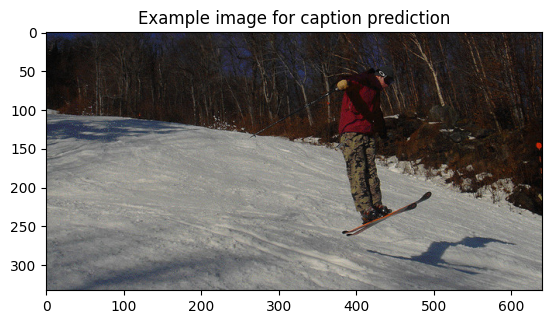

In [69]:
# Visualize sample image, before pre-processing.
plt.imshow(np.squeeze(orig_image))
plt.title("Example image for caption prediction")
plt.show()

In [67]:
# Select appropriate values for the Python variables below.
embed_size = 256
hidden_size = 512

# The size of the vocabulary.
vocab_size = len(data_loader.dataset.vocab)

# Initialize the encoder and decoder, and set each to inference mode.
encoder = EncoderCNN(embed_size)
decoder = DecoderRNN(embed_size, hidden_size, vocab_size)
encoder.eval()
decoder.eval()

# Load the trained weights.
encoder.load_state_dict(torch.load('/content/automatic_image_captioning/models/encoder-3.pkl', map_location=torch.device(device)))
decoder.load_state_dict(torch.load('/content/automatic_image_captioning/models/decoder-3.pkl', map_location=torch.device(device)))

# Move models to GPU if CUDA is available.
encoder.to(device)
decoder.to(device)
image = image.to(device)

# Obtaining the embedded image features.
features = encoder(image).unsqueeze(1)

print(features.shape)
# Passing the embedded image features through the model to get a predicted caption.
output = decoder.sample(features)
print("example output:", output)

torch.Size([1, 1, 256])
example output: [0, 3, 98, 39, 3, 2337, 77, 32, 514, 18, 1]


In [70]:
sentence = clean_sentence(output, data_loader.dataset.vocab.idx2word)
print("Example sentence for the above predicted image caption:", sentence)

assert type(sentence) == str, "Sentence needs to be a Python string!"

Example sentence for the above predicted image caption:  a person on a snowboard in the snow.


## Generating Predictions!

In the code cell below, we have written a function (`get_prediction`) to loop over images in the test dataset and print the model's predicted caption.

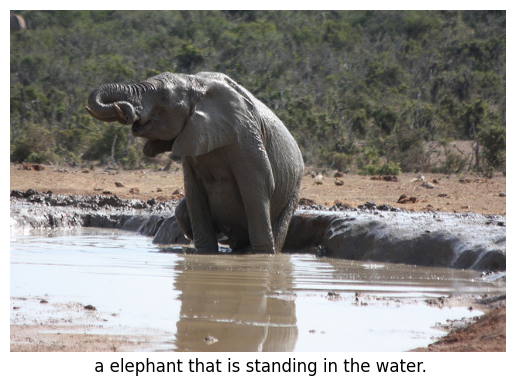

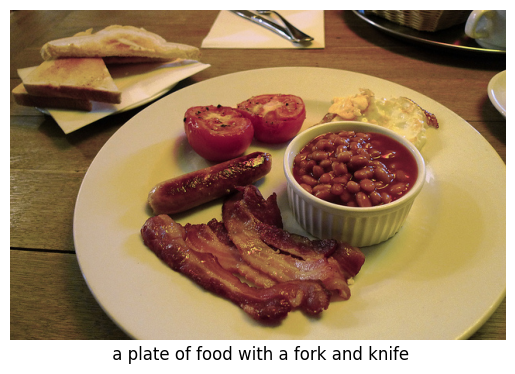

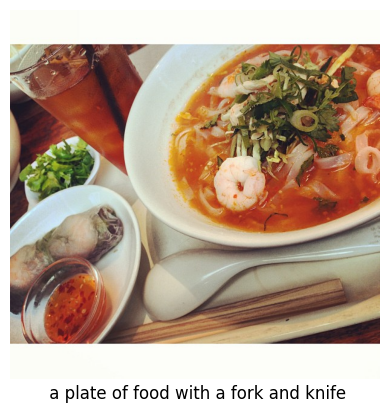

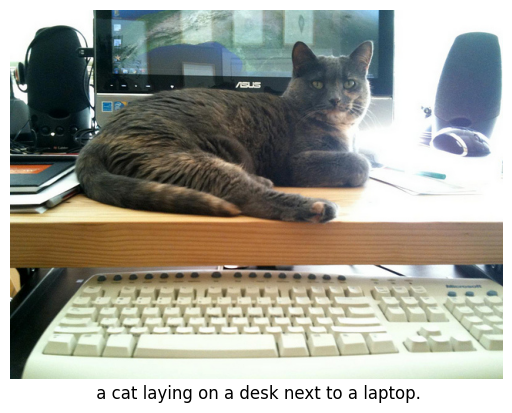

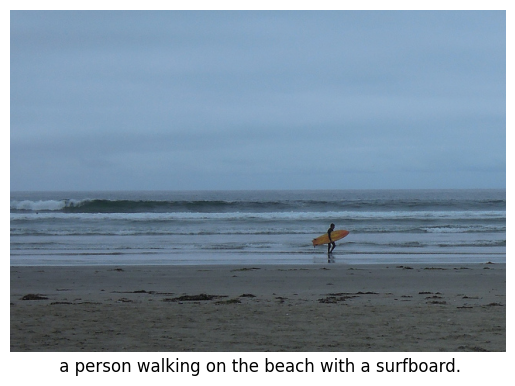

...

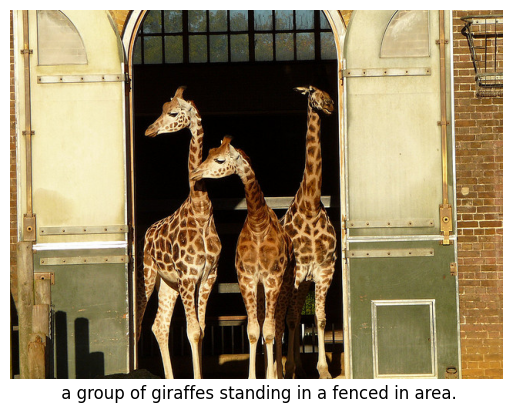

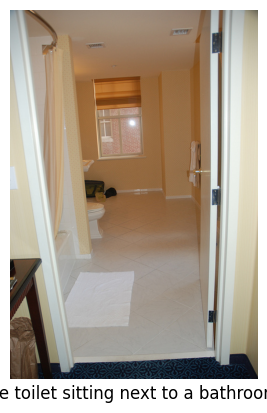

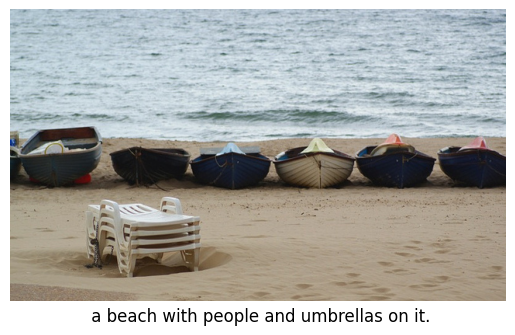

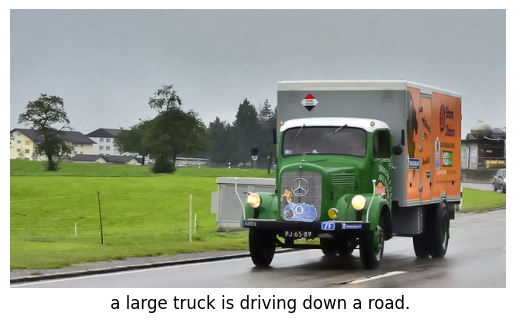

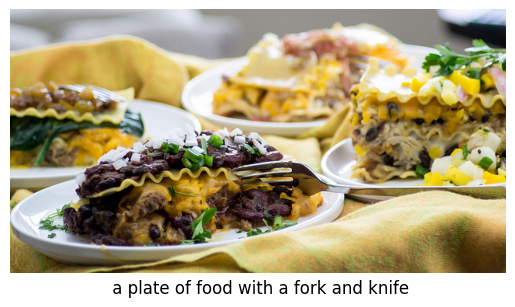

In [63]:
def get_prediction(idx2word, i=0, save=False):
    orig_image, image = next(iter(data_loader))
    image = image.to(device)
    features = encoder(image).unsqueeze(1)
    output = decoder.sample(features)
    sentence = clean_sentence(output, idx2word)

    ax = plt.axes()
    # remove spines
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.spines["left"].set_visible(False)
    # Hide ticks
    ax.xaxis.set_major_locator(plt.NullLocator())
    ax.yaxis.set_major_locator(plt.NullLocator())

    plt.imshow(np.squeeze(orig_image))
    plt.xlabel(sentence, fontsize=12)
    if save:
        plt.savefig(f"samples/sample_{i:03}.png", bbox_inches="tight")
    plt.show()

for i in range(20):
    get_prediction(data_loader.dataset.vocab.idx2word, i=i)